# Provision Audio

In [103]:
import parselmouth
from parselmouth import praat
from parselmouth.praat import call
import os
import subprocess
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import librosa
import librosa.display
import sounddevice as sd
from datetime import datetime
from tqdm import tqdm
import seaborn as sns
import matplotlib.patches as patches

filePath = "../audio-sample/short-version-phonetic/"

In [104]:
audio_list = os.listdir(filePath)
audio_list = [file for file in audio_list if file.endswith(".wav")]
audio_list.sort()

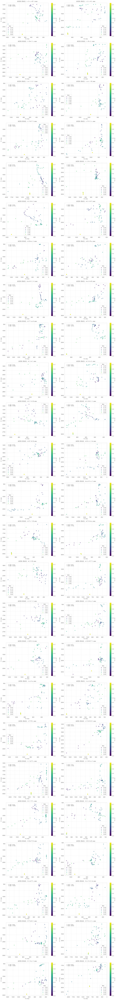

In [105]:
def plot_formant_distribution(audio_name, filePath, ax=None):    
    # WAV 파일 불러오기
    sound = parselmouth.Sound(os.path.join(filePath, audio_name))
    #print(sound.duration)
    # 평균 음원 길이 약 .7s 정도
    time_points = np.arange(0, sound.duration, 0.01)
    f1_list = []
    f2_list = []
    
    # 포먼트 추출 (Burg 방식 사용)
    formants = sound.to_formant_burg(time_step=0.01, 
                                    max_number_of_formants=5.0,
                                    maximum_formant=5000.0, 
                                    window_length=0.025, 
                                    pre_emphasis_from=50.0)

    for time_point in time_points:
        # 특정 시간에서의 F1, F2 값 추출
        f1 = formants.get_value_at_time(1, time_point)
        f2 = formants.get_value_at_time(2, time_point)
        f1_list.append(f1)
        f2_list.append(f2)

    formant_df = pd.DataFrame({"f1": f1_list, "f2": f2_list, "time": time_points})

    # 산점도 그리기
    scatter = sns.scatterplot(data=formant_df, 
                         x="f1", 
                         y="f2", 
                         hue="time", 
                         palette="viridis", 
                         alpha=0.5, 
                         s=50,
                         ax=ax)

    # 축 반전 (언어학 관례)
    ax.invert_xaxis()
    ax.invert_yaxis()

    # 제목과 레이블 설정
    ax.set_title(f'포먼트 분포도: {audio_name}', fontsize=12, pad=10)
    ax.set_xlabel('F1 (Hz)', fontsize=10)
    ax.set_ylabel('F2 (Hz)', fontsize=10)

    # 컬러바 설정
    norm = plt.Normalize(formant_df['time'].min(), formant_df['time'].max())
    sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
    sm.set_array([])
    plt.colorbar(sm, ax=ax).set_label('시간 (초)', fontsize=8)

    # 그리드 설정
    ax.grid(True, linestyle='--', alpha=0.7)
    
    return formant_df

# 메인 코드
# 기본 스타일 설정
sns.set_style("whitegrid")
# 한글 폰트 설정
plt.rcParams['font.family'] = 'AppleGothic'
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.sans-serif'] = ['AppleGothic']  # macOS의 경우
#plt.rcParams['font.family'] = 'sans-serif'


# 서브플롯 개수 계산
n_plots = len(audio_list)
n_cols = 2  # 열 개수 지정
n_rows = (n_plots + 1) // 2  # 행 개수 계산 (올림)

# Figure 생성
fig = plt.figure(figsize=(15, 5*n_rows))

# 각 오디오 파일에 대해 서브플롯 생성
for idx, audio_name in enumerate(audio_list, 1):
    ax = fig.add_subplot(n_rows, n_cols, idx)
    formant_df = plot_formant_distribution(audio_name, filePath, ax)
    
    # 통계 정보를 타이틀 아래에 추가 (선택사항)
    stats = formant_df.describe().round(2)
    ax.text(0.05, 0.95, 
            f'F1 평균: {stats["f1"]["mean"]:.0f}Hz\nF2 평균: {stats["f2"]["mean"]:.0f}Hz',
            transform=ax.transAxes,
            fontsize=8,
            verticalalignment='top')

# 전체 레이아웃 조정
plt.tight_layout()
plt.show()

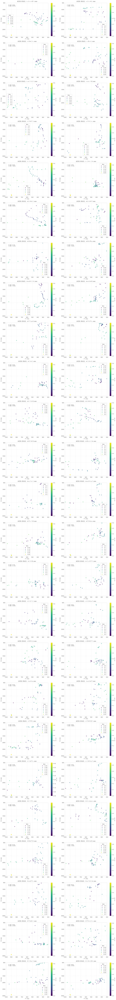

In [118]:
import parselmouth
from parselmouth import praat
from parselmouth.praat import call
import os
import subprocess
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import librosa
import librosa.display
import sounddevice as sd
from datetime import datetime
from tqdm import tqdm
import seaborn as sns
import matplotlib.patches as patches

filePath = "../audio-sample/short-version-phonetic/"
audio_list = os.listdir(filePath)
audio_list = [file for file in audio_list if file.endswith(".wav")]
audio_list.sort()

def plot_formant_distribution(audio_name, filePath, ax=None):    
    # 고정된 축 범위 설정
    F1_MIN, F1_MAX = 200, 1000    # F1 범위 (Hz)
    F2_MIN, F2_MAX = 500, 3000    # F2 범위 (Hz)
    
    # WAV 파일 불러오기
    sound = parselmouth.Sound(os.path.join(filePath, audio_name))
    time_points = np.arange(0, sound.duration, 0.01)
    f1_list = []
    f2_list = []
    
    # 포먼트 추출 (Burg 방식 사용)
    formants = sound.to_formant_burg(time_step=0.01, 
                                    max_number_of_formants=5.0,
                                    maximum_formant=5000.0, 
                                    window_length=0.025, 
                                    pre_emphasis_from=50.0)

    for time_point in time_points:
        # 특정 시간에서의 F1, F2 값 추출
        f1 = formants.get_value_at_time(1, time_point)
        f2 = formants.get_value_at_time(2, time_point)
        if (f1 and f2 and 
            np.isfinite(f1) and np.isfinite(f2) and
            F1_MIN <= f1 <= F1_MAX and 
            F2_MIN <= f2 <= F2_MAX and 
            (f2 - f1) >= 200):  # F2-F1 최소 차이
            f1_list.append(f1)
            f2_list.append(f2)

    formant_df = pd.DataFrame({"f1": f1_list, "f2": f2_list, "time": time_points[:len(f1_list)]})

    if len(formant_df) > 0:
        # 산점도 그리기
        scatter = sns.scatterplot(data=formant_df, 
                             x="f1",  # x축을 F2로 변경
                             y="f2",  # y축을 F1로 변경 
                             hue="time", 
                             palette="viridis", 
                             alpha=0.5, 
                             s=50,
                             ax=ax)

        # 축 범위 설정
        ax.set_xlim(F1_MAX, F1_MIN)  # F2 축 반전
        ax.set_ylim(F2_MAX, F2_MIN)  # F1 축 반전

        # 제목과 레이블 설정
        ax.set_title(f'포먼트 분포도: {audio_name}', fontsize=12, pad=10)
        ax.set_xlabel('F1 (Hz)', fontsize=10)
        ax.set_ylabel('F2 (Hz)', fontsize=10)

        # 컬러바 설정
        norm = plt.Normalize(formant_df['time'].min(), formant_df['time'].max())
        sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
        sm.set_array([])
        plt.colorbar(sm, ax=ax).set_label('시간 (초)', fontsize=8)

        # 그리드 설정
        ax.grid(True, linestyle='--', alpha=0.7)
    
    return formant_df

# 메인 코드
# 기본 스타일 설정
sns.set_style("whitegrid")
# 한글 폰트 설정
plt.rcParams['font.family'] = 'AppleGothic'
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.sans-serif'] = ['AppleGothic']  # macOS의 경우

# 서브플롯 개수 계산
n_plots = len(audio_list)
n_cols = 2  # 열 개수 지정
n_rows = (n_plots + 1) // 2  # 행 개수 계산 (올림)

# Figure 생성
fig = plt.figure(figsize=(15, 5*n_rows))

# 각 오디오 파일에 대해 서브플롯 생성
for idx, audio_name in enumerate(audio_list, 1):
    ax = fig.add_subplot(n_rows, n_cols, idx)
    formant_df = plot_formant_distribution(audio_name, filePath, ax)
    
    # 통계 정보를 타이틀 아래에 추가
    if len(formant_df) > 0:
        stats = formant_df.describe().round(2)
        ax.text(0.05, 0.95, 
                f'F1 평균: {stats["f1"]["mean"]:.0f}Hz\nF2 평균: {stats["f2"]["mean"]:.0f}Hz',
                transform=ax.transAxes,
                fontsize=8,
                verticalalignment='top')

# 전체 레이아웃 조정
plt.tight_layout()
plt.show()

# Exp Audio

In [2]:
filePath = "../../../../Desktop/results"
def tokenization_audio2word(filePath):
    # 실험 결과 폴더 접근.
    for filename in os.listdir(filePath):
        # 특정 참가자 폴더 접근.
        if filename.startswith("participant_"):
            participant_folder = os.path.join(filePath, filename)
        else:
            pass

        # 참가자 폴더 내의 모든 wav 파일 접근.
        if len(os.listdir(participant_folder)) != 6:
            print(f"{filename} 폴더 내의 모든 wav 파일 개수가 6개가 아닙니다.")
            raise ValueError("참가자 폴더 내의 모든 wav 파일 개수가 6개가 아닙니다.")

        # 참가자 폴더 내의 모든 wav 파일 접근.  
        for file in os.listdir(participant_folder):
            # 
            if file.endswith(".wav"):
                print(file)

tokenization_audio2word(filePath)

participant_1 폴더 내의 모든 wav 파일 개수가 6개가 아닙니다.


ValueError: 참가자 폴더 내의 모든 wav 파일 개수가 6개가 아닙니다.

In [4]:
def load_audio(file_path: str):
    """
    오디오 파일을 로드합니다.
    
    Args:
        file_path (str): 오디오 파일 경로
    
    Returns:
        tuple: (y, sr) 오디오 데이터와 샘플링 레이트
    """
    try:
        # librosa를 사용하여 오디오 로드
        y, sr = librosa.load(file_path, sr=44100)
        return y, sr
    except Exception as e:
        print(f"오디오 로드 중 오류 발생: {str(e)}")
        # parselmouth를 사용하여 대체 로드 시도
        try:
            sound = parselmouth.Sound(file_path)
            y = sound.values
            sr = sound.sampling_frequency
            return y, sr
        except Exception as e2:
            print(f"대체 로드 중 오류 발생: {str(e2)}")
            raise
def play_audio_segment(y, sr:int, start_time:float, end_time:float):
    """
    오디오의 특정 구간을 재생합니다.
    
    Args:
        y (np.ndarray): 오디오 데이터
        sr (int): 샘플링 레이트
        start_time (float): 시작 시간 (초)
        end_time (float): 종료 시간 (초)
    """
    sd._terminate()
    sd._initialize()
    sd.query_devices()
    start_sample = int(start_time * sr)
    end_sample = int(end_time * sr)
    segment = y[start_sample:end_sample]
    
    print("재생 중...", end='', flush=True)
    sd.play(segment, sr)
    sd.wait()
    print(" 완료")

In [5]:
import pandas as pd
import os

def check_excel_info(file_path):
    """
    엑셀 파일의 시트 정보를 확인합니다.
    
    Args:
        file_path (str): 엑셀 파일 경로
    """
    try:
        # 엑셀 파일의 모든 시트 정보 가져오기
        excel_file = pd.ExcelFile(file_path)
        sheet_names = excel_file.sheet_names
        
        print(f"\n파일명: {os.path.basename(file_path)}")
        print(f"총 시트 수: {len(sheet_names)}")
        print("\n시트 목록:")
        for i, sheet_name in enumerate(sheet_names, 1):
            # 각 시트의 기본 정보 가져오기
            df = pd.read_excel(file_path, sheet_name=sheet_name)
            print(f"\n{i}. 시트명: {sheet_name}")
            print(f"   - 행 수: {len(df)}")
            print(f"   - 열 수: {len(df.columns)}")
            print(f"   - 열 이름: {list(df.columns)}")
            
    except Exception as e:
        print(f"오류 발생: {str(e)}")


In [20]:
def detect_speech_segments_direct(sound, min_silence_duration=0.3, min_speech_duration=0.1, silence_threshold=-25):
    """
    직접 intensity 분석을 통해 음성 구간을 감지합니다.
    
    Args:
        sound: Praat Sound 객체
        min_silence_duration (float): 최소 묵음 구간 길이 (초)
        min_speech_duration (float): 최소 발화 구간 길이 (초)
        silence_threshold (float): 묵음 판단 기준값 (dB)
    
    Returns:
        list: [(시작시간, 종료시간), ...] 형태의 발화 구간 리스트
    """
    try:
        # 음성 강도(intensity) 추출
        intensity = sound.to_intensity()
        
        # intensity 값과 시간 추출
        values = intensity.values[0]  # intensity values
        times = intensity.xs()        # time points
        
        # 최대 강도 계산
        max_intensity = np.max(values)
        threshold = max_intensity + silence_threshold  # 상대적 임계값 적용
        
        print(f"강도 분석:")
        print(f"- 최대 강도: {max_intensity:.1f} dB")
        print(f"- 임계값: {threshold:.1f} dB")
        
        # 발화 구간 찾기
        segments = []
        is_speech = False
        start_time = None
        
        for i, (time, value) in enumerate(zip(times, values)):
            is_above_threshold = value > threshold
            
            if is_above_threshold and not is_speech:
                # 발화 시작
                start_time = time
                is_speech = True
            elif not is_above_threshold and is_speech:
                # 발화 종료
                if start_time is not None:
                    duration = time - start_time
                    if duration >= min_speech_duration:
                        segments.append((start_time, time))
                is_speech = False
                start_time = None
        
        # 마지막 발화 구간 처리
        if is_speech and start_time is not None:
            duration = times[-1] - start_time
            if duration >= min_speech_duration:
                segments.append((start_time, times[-1]))
        
        # 인접한 구간 병합
        merged_segments = []
        if segments:
            current_start, current_end = segments[0]
            
            for start, end in segments[1:]:
                if start - current_end <= min_silence_duration:
                    # 구간 병합
                    current_end = end
                else:
                    # 새로운 구간 추가
                    merged_segments.append((current_start, current_end))
                    current_start, current_end = start, end
            
            merged_segments.append((current_start, current_end))
        
        return merged_segments
        
    except Exception as e:
        print(f"음성 구간 감지 중 오류 발생: {str(e)}")
        return []

def analyze_audio_with_praat(audio_path):
    """
    오디오 파일을 분석합니다.
    """
    try:
        # Praat Sound 객체 생성
        sound = parselmouth.Sound(audio_path)
        print(f"\n=== 파일 분석: {os.path.basename(audio_path)} ===")
        print(f"파일 정보:")
        print(f"- 길이: {sound.duration:.2f} 초")
        print(f"- 샘플링 레이트: {sound.sampling_frequency} Hz")
        
        # 다양한 임계값으로 시도
        thresholds = [-20, -25, -30, -35]
        best_segments = []
        best_threshold = None
        
        for threshold in thresholds:
            print(f"\n임계값 {threshold} dB 테스트 중...")
            segments = detect_speech_segments_direct(
                sound,
                silence_threshold=threshold,
                min_silence_duration=0.3,
                min_speech_duration=0.1
            )
            
            print(f"감지된 발화 구간 수: {len(segments)}")
            if segments:
                if not best_segments or len(segments) > len(best_segments):
                    best_segments = segments
                    best_threshold = threshold
        
        if best_segments:
            print(f"\n최적의 임계값: {best_threshold} dB")
            print(f"감지된 총 발화 구간 수: {len(best_segments)}")
            for i, (start, end) in enumerate(best_segments):
                print(f"구간 {i+1}: {start:.3f}s - {end:.3f}s (길이: {end-start:.3f}s)")
                
                # 구간별 음성 특성 분석
                segment = sound.extract_part(from_time=start, to_time=end)
                intensity = segment.to_intensity()
                pitch = segment.to_pitch()
                
                mean_intensity = call(intensity, "Get mean", 0, 0)
                mean_pitch = call(pitch, "Get mean", 0, 0, "Hertz")
                
                print(f"- 평균 강도: {mean_intensity:.1f} dB")
                print(f"- 평균 피치: {mean_pitch:.1f} Hz")
        else:
            print("\n발화 구간을 찾을 수 없습니다.")
        
        return best_segments
        
    except Exception as e:
        print(f"Error: 분석 중 오류 발생 - {str(e)}")
        return None

# 테스트
sample_path = "../../../../Desktop/results/participant_13"
audio_list = [f for f in os.listdir(sample_path) if f.endswith(".wav")]
audio_list.sort()

# 첫 번째 파일로 테스트
if audio_list:
    audio_path = os.path.join(sample_path, audio_list[0])
    segments = analyze_audio_with_praat(audio_path)


=== 파일 분석: 13_stage1_20250404_1743.wav ===
파일 정보:
- 길이: 10.79 초
- 샘플링 레이트: 44100.0 Hz

임계값 -20 dB 테스트 중...
강도 분석:
- 최대 강도: 76.6 dB
- 임계값: 56.6 dB
감지된 발화 구간 수: 3

임계값 -25 dB 테스트 중...
강도 분석:
- 최대 강도: 76.6 dB
- 임계값: 51.6 dB
감지된 발화 구간 수: 3

임계값 -30 dB 테스트 중...
강도 분석:
- 최대 강도: 76.6 dB
- 임계값: 46.6 dB
감지된 발화 구간 수: 3

임계값 -35 dB 테스트 중...
강도 분석:
- 최대 강도: 76.6 dB
- 임계값: 41.6 dB
감지된 발화 구간 수: 3

최적의 임계값: -20 dB
감지된 총 발화 구간 수: 3
구간 1: 3.113s - 3.593s (길이: 0.480s)
- 평균 강도: 62.3 dB
- 평균 피치: 249.3 Hz
구간 2: 6.721s - 7.225s (길이: 0.504s)
- 평균 강도: 61.9 dB
- 평균 피치: 228.0 Hz
구간 3: 9.457s - 9.985s (길이: 0.528s)
- 평균 강도: 50.9 dB
- 평균 피치: 224.9 Hz



Info, word count: 1

Stage1, word count: 3
../../../../Desktop/results/participant_13/13_stage1_20250404_1743.wav
강도 분석:
- 최대 강도: 76.6 dB
- 임계값: 27.6 dB
detected segments: 5
포먼트 분석 결과:
- 유효 포인트 수: 27
- F1 범위: 218-315 Hz
- F2 범위: 1676-1871 Hz
포먼트 분석 결과:
- 유효 포인트 수: 126
- F1 범위: 351-977 Hz
- F2 범위: 1455-2330 Hz
포먼트 분석 결과:
- 유효 포인트 수: 56
- F1 범위: 424-809 Hz
- F2 범위: 1506-2025 Hz
포먼트 분석 결과:
- 유효 포인트 수: 11
- F1 범위: 481-986 Hz
- F2 범위: 1628-1953 Hz
포먼트 분석 결과:
- 유효 포인트 수: 93
- F1 범위: 384-893 Hz
- F2 범위: 1614-2126 Hz

세그먼트 1 (1.38s - 1.90s):
F1 평균: 260.0Hz (표준편차: 23.8Hz)
F2 평균: 1761.7Hz (표준편차: 49.4Hz)

세그먼트 2 (2.52s - 4.31s):
F1 평균: 700.4Hz (표준편차: 170.6Hz)
F2 평균: 1900.3Hz (표준편차: 206.8Hz)

세그먼트 3 (6.67s - 7.38s):
F1 평균: 558.2Hz (표준편차: 94.6Hz)
F2 평균: 1885.3Hz (표준편차: 120.5Hz)

세그먼트 4 (8.10s - 8.49s):
F1 평균: 735.1Hz (표준편차: 165.1Hz)
F2 평균: 1778.8Hz (표준편차: 116.2Hz)

세그먼트 5 (8.97s - 10.76s):
F1 평균: 566.2Hz (표준편차: 127.3Hz)
F2 평균: 1863.2Hz (표준편차: 120.2Hz)

Stage2, word count: 50


<Figure size 1500x12500 with 0 Axes>

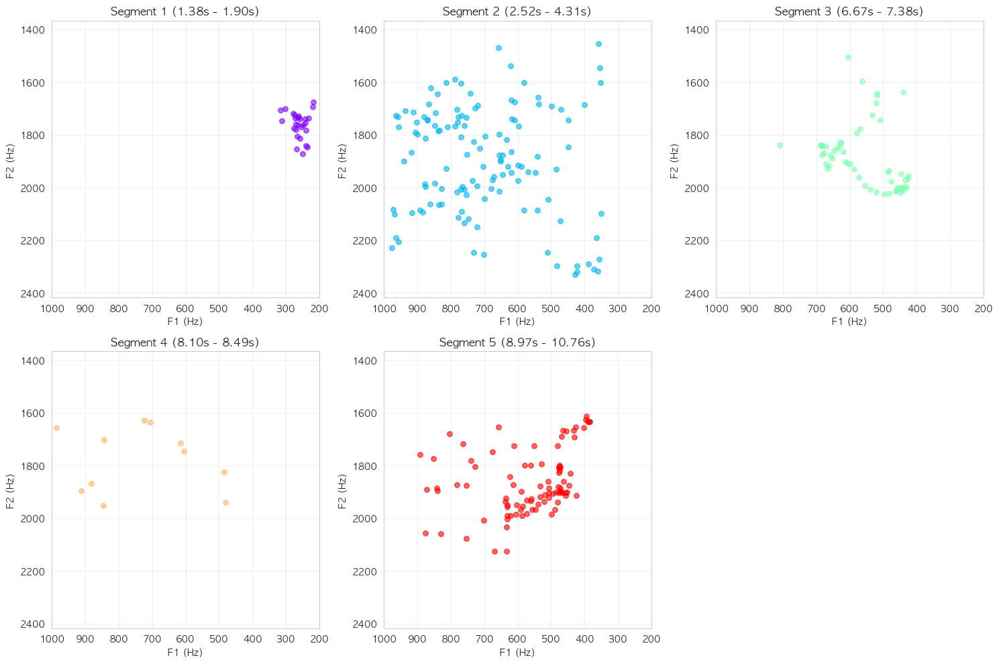

../../../../Desktop/results/participant_13/13_stage2_20250404_1744.wav
강도 분석:
- 최대 강도: 84.6 dB
- 임계값: 35.6 dB
detected segments: 54
포먼트 분석 결과:
- 유효 포인트 수: 78
- F1 범위: 302-636 Hz
- F2 범위: 1310-2865 Hz
포먼트 분석 결과:
- 유효 포인트 수: 8
- F1 범위: 104-228 Hz
- F2 범위: 1950-2114 Hz
포먼트 분석 결과:
- 유효 포인트 수: 62
- F1 범위: 526-996 Hz
- F2 범위: 1176-2001 Hz
포먼트 분석 결과:
- 유효 포인트 수: 18
- F1 범위: 153-245 Hz
- F2 범위: 1680-1939 Hz
포먼트 분석 결과:
- 유효 포인트 수: 18
- F1 범위: 556-606 Hz
- F2 범위: 1818-2073 Hz
포먼트 분석 결과:
- 유효 포인트 수: 76
- F1 범위: 398-995 Hz
- F2 범위: 1379-2322 Hz
포먼트 분석 결과:
- 유효 포인트 수: 99
- F1 범위: 226-805 Hz
- F2 범위: 1069-2384 Hz
포먼트 분석 결과:
- 유효 포인트 수: 84
- F1 범위: 251-787 Hz
- F2 범위: 1041-1611 Hz
포먼트 분석 결과:
- 유효 포인트 수: 61
- F1 범위: 294-545 Hz
- F2 범위: 1247-2146 Hz
포먼트 분석 결과:
- 유효 포인트 수: 24
- F1 범위: 214-281 Hz
- F2 범위: 1630-1914 Hz
포먼트 분석 결과:
- 유효 포인트 수: 93
- F1 범위: 226-977 Hz
- F2 범위: 958-1831 Hz
포먼트 분석 결과:
- 유효 포인트 수: 94
- F1 범위: 212-614 Hz
- F2 범위: 1297-2366 Hz
포먼트 분석 결과:
- 유효 포인트 수: 69
- F1 범위: 275-621 Hz
- F2 범위:

<Figure size 1500x12500 with 0 Axes>

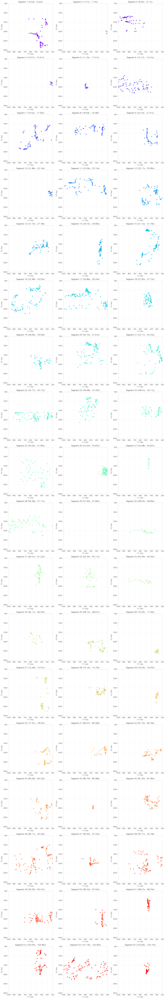

../../../../Desktop/results/participant_13/13_stage3_20250404_1746.wav
강도 분석:
- 최대 강도: 72.3 dB
- 임계값: 23.3 dB
detected segments: 1
포먼트 분석 결과:
- 유효 포인트 수: 1277
- F1 범위: 332-908 Hz
- F2 범위: 1520-2169 Hz

세그먼트 1 (0.34s - 26.30s):
F1 평균: 618.7Hz (표준편차: 146.7Hz)
F2 평균: 1847.6Hz (표준편차: 152.7Hz)

Stage4, word count: 150


<Figure size 1500x12500 with 0 Axes>

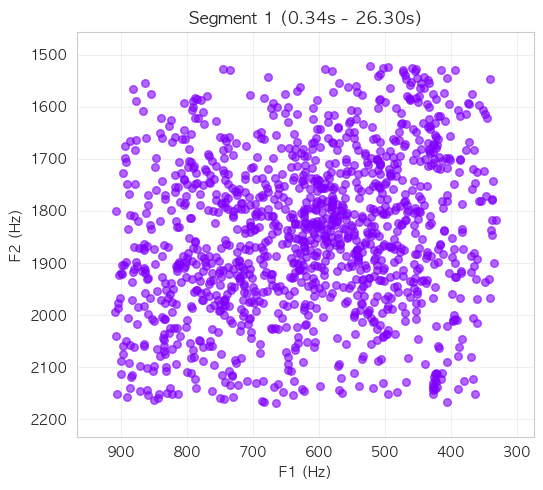

../../../../Desktop/results/participant_13/13_stage4_20250404_1747.wav
강도 분석:
- 최대 강도: 87.3 dB
- 임계값: 38.3 dB
detected segments: 149
포먼트 분석 결과:
- 유효 포인트 수: 39
- F1 범위: 456-563 Hz
- F2 범위: 1554-2424 Hz
포먼트 분석 결과:
- 유효 포인트 수: 15
- F1 범위: 98-195 Hz
- F2 범위: 1484-1912 Hz
포먼트 분석 결과:
- 유효 포인트 수: 31
- F1 범위: 410-530 Hz
- F2 범위: 1581-1984 Hz
포먼트 분석 결과:
- 유효 포인트 수: 35
- F1 범위: 425-456 Hz
- F2 범위: 1053-1425 Hz
포먼트 분석 결과:
- 유효 포인트 수: 57
- F1 범위: 129-817 Hz
- F2 범위: 1496-1922 Hz
포먼트 분석 결과:
- 유효 포인트 수: 33
- F1 범위: 333-519 Hz
- F2 범위: 1279-2348 Hz
포먼트 분석 결과:
- 유효 포인트 수: 47
- F1 범위: 315-736 Hz
- F2 범위: 1247-2118 Hz
포먼트 분석 결과:
- 유효 포인트 수: 63
- F1 범위: 244-466 Hz
- F2 범위: 1588-2358 Hz
포먼트 분석 결과:
- 유효 포인트 수: 32
- F1 범위: 245-608 Hz
- F2 범위: 1298-2169 Hz
포먼트 분석 결과:
- 유효 포인트 수: 68
- F1 범위: 229-821 Hz
- F2 범위: 1069-1952 Hz
포먼트 분석 결과:
- 유효 포인트 수: 51
- F1 범위: 302-363 Hz
- F2 범위: 2375-2625 Hz
포먼트 분석 결과:
- 유효 포인트 수: 14
- F1 범위: 677-875 Hz
- F2 범위: 1302-1660 Hz
포먼트 분석 결과:
- 유효 포인트 수: 41
- F1 범위: 271-621 Hz
- F2 범

<Figure size 1500x12500 with 0 Axes>

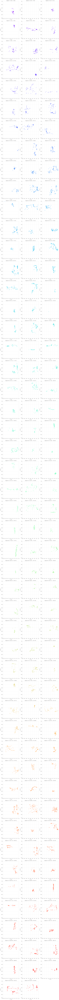

../../../../Desktop/results/participant_13/13_stage5_20250404_1752.wav
강도 분석:
- 최대 강도: 85.2 dB
- 임계값: 36.2 dB
detected segments: 146
포먼트 분석 결과:
- 유효 포인트 수: 34
- F1 범위: 358-549 Hz
- F2 범위: 771-2337 Hz
포먼트 분석 결과:
- 유효 포인트 수: 48
- F1 범위: 253-675 Hz
- F2 범위: 1579-1881 Hz
포먼트 분석 결과:
- 유효 포인트 수: 20
- F1 범위: 452-554 Hz
- F2 범위: 1599-2189 Hz
포먼트 분석 결과:
- 유효 포인트 수: 56
- F1 범위: 212-521 Hz
- F2 범위: 1585-1956 Hz
포먼트 분석 결과:
- 유효 포인트 수: 44
- F1 범위: 257-387 Hz
- F2 범위: 1919-2515 Hz
포먼트 분석 결과:
- 유효 포인트 수: 28
- F1 범위: 375-541 Hz
- F2 범위: 1882-2009 Hz
포먼트 분석 결과:
- 유효 포인트 수: 46
- F1 범위: 230-527 Hz
- F2 범위: 1334-1949 Hz
포먼트 분석 결과:
- 유효 포인트 수: 32
- F1 범위: 243-520 Hz
- F2 범위: 1377-1997 Hz
포먼트 분석 결과:
- 유효 포인트 수: 40
- F1 범위: 325-690 Hz
- F2 범위: 1269-1950 Hz
포먼트 분석 결과:
- 유효 포인트 수: 47
- F1 범위: 305-555 Hz
- F2 범위: 890-1623 Hz
포먼트 분석 결과:
- 유효 포인트 수: 46
- F1 범위: 269-761 Hz
- F2 범위: 1051-1637 Hz
포먼트 분석 결과:
- 유효 포인트 수: 67
- F1 범위: 212-720 Hz
- F2 범위: 930-1913 Hz
포먼트 분석 결과:
- 유효 포인트 수: 53
- F1 범위: 147-611 Hz
- F2 범위:

<Figure size 1500x12500 with 0 Axes>

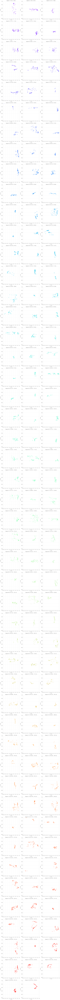

../../../../Desktop/results/participant_13/13_stage6_20250404_1757.wav
강도 분석:
- 최대 강도: 84.2 dB
- 임계값: 35.2 dB
detected segments: 48
포먼트 분석 결과:
- 유효 포인트 수: 45
- F1 범위: 393-737 Hz
- F2 범위: 1566-1951 Hz
포먼트 분석 결과:
- 유효 포인트 수: 25
- F1 범위: 398-573 Hz
- F2 범위: 1896-2098 Hz
포먼트 분석 결과:
- 유효 포인트 수: 36
- F1 범위: 342-421 Hz
- F2 범위: 1306-2121 Hz
포먼트 분석 결과:
- 유효 포인트 수: 32
- F1 범위: 368-573 Hz
- F2 범위: 2060-2274 Hz
포먼트 분석 결과:
- 유효 포인트 수: 39
- F1 범위: 365-444 Hz
- F2 범위: 1029-1289 Hz
포먼트 분석 결과:
- 유효 포인트 수: 28
- F1 범위: 463-553 Hz
- F2 범위: 1827-2262 Hz
포먼트 분석 결과:
- 유효 포인트 수: 51
- F1 범위: 400-618 Hz
- F2 범위: 839-1867 Hz
포먼트 분석 결과:
- 유효 포인트 수: 33
- F1 범위: 366-631 Hz
- F2 범위: 864-2348 Hz
포먼트 분석 결과:
- 유효 포인트 수: 48
- F1 범위: 375-576 Hz
- F2 범위: 1635-2261 Hz
포먼트 분석 결과:
- 유효 포인트 수: 64
- F1 범위: 263-749 Hz
- F2 범위: 1383-1968 Hz
포먼트 분석 결과:
- 유효 포인트 수: 60
- F1 범위: 420-665 Hz
- F2 범위: 1482-1952 Hz
포먼트 분석 결과:
- 유효 포인트 수: 32
- F1 범위: 357-500 Hz
- F2 범위: 1578-2472 Hz
포먼트 분석 결과:
- 유효 포인트 수: 51
- F1 범위: 321-400 Hz
- F2 범위:

<Figure size 1500x12500 with 0 Axes>

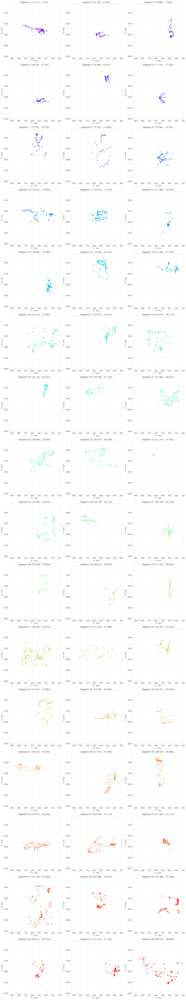

In [120]:
sample_path = "../../../../Desktop/results/participant_13"
xlsxPath = list(os.listdir(sample_path))
xlsxPath = [file for file in xlsxPath if file.endswith(".xlsx")][0]
excel_file = pd.ExcelFile(os.path.join(sample_path, xlsxPath))

audio_list = os.listdir(sample_path)
audio_list = [file for file in audio_list if file.endswith(".wav")]
audio_list.sort()

for sheet_name in excel_file.sheet_names:
    sheet = pd.read_excel(os.path.join(sample_path, xlsxPath), sheet_name=sheet_name)
    print("\n=================================================")
    print(f"{sheet_name}, word count: {len(sheet)}")
    if not ("시작시간" in sheet.columns.tolist()) or sheet_name == "Info":
        continue

    audio_name = next((item for item in audio_list if sheet_name.lower() in item.lower()), None)
    audio_path = os.path.join(sample_path, audio_name)
    
    audio, sr = librosa.load(audio_path, sr=44100)
    """
    mel_spec = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=128)
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    librosa.display.specshow(mel_spec_db, sr=sr, x_axis='time', y_axis='mel', fmax=8000)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-spectrogram')
    plt.tight_layout()
    
    """
    plt.show()
    
    # Praat Sound 객체 생성
    sound = parselmouth.Sound(audio_path)
    print(audio_path)
        
        # 음성 구간 감지
    segments = detect_speech_segments_direct(
                sound,
                silence_threshold=-49,
                min_silence_duration=0.4,
                min_speech_duration=0.18
    )
    print(f"detected segments: {len(segments)}")
    """
    for start, end in segments:
        print(f"duration: {end - start}")
        play_audio_segment(y=audio, sr=44100, start_time=start, end_time=end)
        plot_formant_distribution(audio_name, filePath, ax=None)
    """
    
    fig = plt.figure(figsize=(15, 5*n_rows))
    #for idx, audio_name in enumerate(audio_list):
        #ax = fig.add_subplot(n_rows, n_cols, idx)
    fig, f1_values, f2_values = plot_formants_for_segments(sound, segments)
        
        #for start, end in segments:
            #print(f"duration: {end - start}")
            #play_audio_segment(y=audio, sr=44100, start_time=start, end_time=end)

    #plt.show()
    continue

    
    stage_start_time = datetime.strptime(sheet.iloc[0]["시작시간"], '%Y-%m-%d %H:%M:%S.%f')

    for idx, row in sheet.iterrows():
        dt1 = datetime.strptime(row["시작시간"], '%Y-%m-%d %H:%M:%S.%f')
        dt2 = datetime.strptime(row["스페이스바_시간"], '%Y-%m-%d %H:%M:%S.%f')
        
        # 시간 차이 계산
        word_start_time = abs(dt1 - stage_start_time).total_seconds()
        word_end_time = abs(dt2 - stage_start_time).total_seconds()
        duration = abs(dt2 - dt1).total_seconds()
        print(sheet.iloc[idx])
        play_audio_segment(y=audio, sr=sr, start_time=word_start_time, end_time=word_end_time)
    #break

In [119]:
def extract_formants_for_segment(sound, start_time, end_time):
    """
    특정 구간의 F1, F2 포먼트 값을 추출합니다.
    
    Args:
        sound: Praat Sound 객체
        start_time: 시작 시간
        end_time: 종료 시간
    
    Returns:
        tuple: (f1_values, f2_values, times)
    """
    try:
        # 구간 추출
        segment = sound.extract_part(from_time=start_time, to_time=end_time)
        
        # 포먼트 분석
        formants = segment.to_formant_burg(
            time_step=0.005,              # 5ms 단위로 분석
            max_number_of_formants=5.0,   # 최대 5개 포먼트 추적
            maximum_formant=5500.0,       # 최대 주파수
            window_length=0.025,          # 25ms 윈도우
            pre_emphasis_from=50.0        # 프리엠퍼시스 시작 주파수
        )
        
        # 시간 포인트 생성
        duration = end_time - start_time
        times = np.arange(0, duration, 0.005)
        
        f1_values = []
        f2_values = []
        valid_times = []
        
        # F1, F2 범위 설정 (Hz)
        F1_MIN, F1_MAX = 0, 1000    # F1 범위
        F2_MIN, F2_MAX = 0, 3000    # F2 범위
        F2_F1_MIN_DIFF = 200          # F2-F1 최소 차이
        
        for t in times:
            try:
                f1 = formants.get_value_at_time(1, t)
                f2 = formants.get_value_at_time(2, t)
                
                # NaN과 inf 체크
                if (f1 is not None and f2 is not None and 
                    np.isfinite(f1) and np.isfinite(f2) and
                    F1_MIN <= f1 <= F1_MAX and 
                    F2_MIN <= f2 <= F2_MAX and 
                    (f2 - f1) >= F2_F1_MIN_DIFF):
                    
                    f1_values.append(f1)
                    f2_values.append(f2)
                    valid_times.append(t + start_time)
            except:
                continue
        
        # 중앙값 기반 이상치 제거
        if len(f1_values) > 0:
            f1_array = np.array(f1_values)
            f2_array = np.array(f2_values)
            times_array = np.array(valid_times)
            
            # NaN이나 inf가 있는 행 제거
            valid_mask = np.isfinite(f1_array) & np.isfinite(f2_array)
            f1_array = f1_array[valid_mask]
            f2_array = f2_array[valid_mask]
            times_array = times_array[valid_mask]
            
            if len(f1_array) > 0:
                # 중앙값과 MAD 계산
                f1_median = np.median(f1_array)
                f2_median = np.median(f2_array)
                f1_mad = np.median(np.abs(f1_array - f1_median))
                f2_mad = np.median(np.abs(f2_array - f2_median))
                
                # 이상치 제거
                valid_indices = (
                    (np.abs(f1_array - f1_median) <= 2 * f1_mad) &
                    (np.abs(f2_array - f2_median) <= 2 * f2_mad)
                )
                
                f1_array = f1_array[valid_indices]
                f2_array = f2_array[valid_indices]
                times_array = times_array[valid_indices]
                
                if len(f1_array) > 0:
                    print(f"포먼트 분석 결과:")
                    print(f"- 유효 포인트 수: {len(f1_array)}")
                    print(f"- F1 범위: {np.min(f1_array):.0f}-{np.max(f1_array):.0f} Hz")
                    print(f"- F2 범위: {np.min(f2_array):.0f}-{np.max(f2_array):.0f} Hz")
                    
                    return f1_array, f2_array, times_array
        
        return np.array([]), np.array([]), np.array([])
    
    except Exception as e:
        print(f"포먼트 추출 중 오류 발생: {str(e)}")
        return np.array([]), np.array([]), np.array([])

def plot_formants_for_segments(sound, segments, fig=None):
    """
    각 segment를 개별 subplot에 그리고 축 범위를 통일합니다.
    """
    n_segments = len(segments)
    
    # subplot 행/열 수 계산
    n_cols = 3  # 한 행에 3개의 subplot
    n_rows = (n_segments + n_cols - 1) // n_cols  # 올림 나눗셈
    
    if fig is None:
        fig = plt.figure(figsize=(15, 5*n_rows))
    
    all_f1 = []
    all_f2 = []
    axes = []  # 모든 subplot의 axes를 저장할 리스트
    
    # 각 세그먼트별 색상 지정
    colors = plt.cm.rainbow(np.linspace(0, 1, n_segments))
    
    # 먼저 모든 데이터의 범위를 계산하기 위해 포먼트 값 수집
    all_segment_data = []
    for i, (start, end) in enumerate(segments):
        f1_values, f2_values, times = extract_formants_for_segment(sound, start, end)
        if len(f1_values) > 0:
            valid_mask = np.isfinite(f1_values) & np.isfinite(f2_values)
            f1_values = f1_values[valid_mask]
            f2_values = f2_values[valid_mask]
            if len(f1_values) > 0:
                all_segment_data.append((f1_values, f2_values))
                all_f1.extend(f1_values)
                all_f2.extend(f2_values)
    
    # 전체 데이터의 범위 계산
    if all_f1 and all_f2:
        f1_min, f1_max = np.min(all_f1), np.max(all_f1)
        f2_min, f2_max = np.min(all_f2), np.max(all_f2)
        
        # 범위에 여유 추가 (10% 마진)
        f1_margin = (f1_max - f1_min) * 0.1
        f2_margin = (f2_max - f2_min) * 0.1
        
        # 최종 범위 설정 (일반적인 F1-F2 범위 내에서)
        f1_min = max(200, f1_min - f1_margin)
        f1_max = min(1000, f1_max + f1_margin)
        f2_min = max(500, f2_min - f2_margin)
        f2_max = min(3000, f2_max + f2_margin)
    else:
        # 기본 범위 설정
        f1_min, f1_max = 200, 1000
        f2_min, f2_max = 500, 3000
    
    # 각 세그먼트 플롯
    for i, (start, end) in enumerate(segments):
        # 각 세그먼트별 subplot 생성
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        axes.append(ax)
        
        if i < len(all_segment_data):
            f1_values, f2_values = all_segment_data[i]
            
            # 산점도 그리기
            ax.scatter(f1_values, f2_values, c=[colors[i]], 
                      alpha=0.6, s=30)
            
            # 평균값 표시
            mean_f1 = np.mean(f1_values)
            mean_f2 = np.mean(f2_values)
            ax.plot(mean_f2, mean_f1, 'x', color=colors[i], 
                   markersize=15, markeredgewidth=3)
            
            # 표준편차 타원 그리기
            if len(f1_values) > 2:
                try:
                    cov = np.cov(f2_values, f1_values)
                    if not (np.isnan(cov).any() or np.isinf(cov).any()):
                        eigenvals, eigenvecs = np.linalg.eig(cov)
                        if not (np.isnan(eigenvals).any() or np.isinf(eigenvals).any()):
                            angle = np.degrees(np.arctan2(eigenvecs[1,0], eigenvecs[0,0]))
                            
                            ellip = patches.Ellipse(xy=(mean_f2, mean_f1),
                                                  width=2*np.sqrt(eigenvals[0]),
                                                  height=2*np.sqrt(eigenvals[1]),
                                                  angle=angle,
                                                  fill=False,
                                                  color=colors[i],
                                                  alpha=0.3)
                            ax.add_patch(ellip)
                except Exception as e:
                    print(f"세그먼트 {i+1}의 타원 그리기 실패: {str(e)}")
            
            print(f"\n세그먼트 {i+1} ({start:.2f}s - {end:.2f}s):")
            print(f"F1 평균: {mean_f1:.1f}Hz (표준편차: {np.std(f1_values):.1f}Hz)")
            print(f"F2 평균: {mean_f2:.1f}Hz (표준편차: {np.std(f2_values):.1f}Hz)")
        
        # 모든 subplot에 동일한 설정 적용
        ax.invert_yaxis()
        ax.invert_xaxis()
        ax.set_xlabel('F1 (Hz)')
        ax.set_ylabel('F2 (Hz)')
        ax.set_title(f'Segment {i+1} ({start:.2f}s - {end:.2f}s)')
        ax.grid(True, alpha=0.3)
        
        # 모든 subplot에 동일한 축 범위 설정
        ax.set_xlim(f1_max, f1_min)  # F2 축 반전
        ax.set_ylim(f2_max, f2_min)  # F1 축 반전
    
    plt.tight_layout()
    return fig, all_f1, all_f2

In [24]:
sheet

,참가자번호,단계,단어,시작시간,스페이스바_시간
0,1,2,송부,2025-04-02 19:00:10.638291,2025-04-02 19:00:11.984072
1,1,2,상기,2025-04-02 19:00:11.984072,2025-04-02 19:00:13.420275
2,1,2,파군,2025-04-02 19:00:13.423106,2025-04-02 19:00:15.061933
3,1,2,샐쭉,2025-04-02 19:00:15.064501,2025-04-02 19:00:16.650166
4,1,2,매복,2025-04-02 19:00:16.662919,2025-04-02 19:00:18.051203
5,1,2,팽배,2025-04-02 19:00:18.051203,2025-04-02 19:00:19.336119
6,1,2,폭압,2025-04-02 19:00:19.336119,2025-04-02 19:00:20.709594
7,1,2,내빈,2025-04-02 19:00:20.710130,2025-04-02 19:00:22.213031
8,1,2,품띠,2025-04-02 19:00:22.213031,2025-04-02 19:00:23.595277
9,1,2,판본,2025-04-02 19:00:23.595277,2025-04-02 19:00:25.181145


In [12]:
sheet

,참가자번호,단계,단어,시작시간,스페이스바_시간
0,1,1,레커,2025-04-02 18:59:55.660093,2025-04-02 18:59:58.231983
1,1,1,러쉬,2025-04-02 18:59:58.231983,2025-04-02 19:00:00.068018
2,1,1,러셀,2025-04-02 19:00:00.069771,2025-04-02 19:00:01.696563


In [24]:

dt1 = datetime.strptime(sheet.iloc[0]["시작시간"], '%Y-%m-%d %H:%M:%S.%f')
dt2 = datetime.strptime(sheet.iloc[0]["스페이스바_시간"], '%Y-%m-%d %H:%M:%S.%f')
    
    # 시간 차이 계산
time_diff = abs(dt2 - dt1)
time_diff.total_seconds()

2.57189

In [40]:
print(sd.query_devices())

  0 iPhone Microphone, Core Audio (1 in, 0 out)
> 1 박주현's AirPods Pro, Core Audio (1 in, 0 out)
< 2 박주현's AirPods Pro, Core Audio (0 in, 2 out)
  3 MacBook Pro Microphone, Core Audio (1 in, 0 out)
  4 MacBook Pro Speakers, Core Audio (0 in, 2 out)


In [ ]:
def analyze_formants(wav_file_path, time_point=0.5, fig=None, subplot_position=None):
    """
    WAV 파일의 포먼트를 분석하고 시각화합니다.
    
    Args:
        wav_file_path (str): WAV 파일 경로
        time_point (float): 특정 시간 지점 (초 단위, 기본값: 0.5초)
        fig (matplotlib.figure.Figure, optional): 기존 figure 객체
        subplot_position (tuple, optional): (행, 열, 위치) 형태의 서브플롯 위치
    
    Returns:
        tuple: (figure 객체, F1, F2) 특정 시간 지점에서의 포먼트 값
    """
    # 한글 폰트 설정
    plt.rcParams['font.family'] = 'AppleGothic'
    plt.rcParams['axes.unicode_minus'] = False
    
    # WAV 파일 불러오기
    sound = parselmouth.Sound(wav_file_path)
    
    # 포먼트 추출 (Burg 방식 사용)
    formants = sound.to_formant_burg(time_step=0.01, 
                                    max_number_of_formants=5.0,
                                    maximum_formant=5000.0, 
                                    window_length=0.025, 
                                    pre_emphasis_from=50.0)
    
    # 특정 시간에서의 F1, F2 값 추출
    f1 = formants.get_value_at_time(1, time_point)
    f2 = formants.get_value_at_time(2, time_point)
    
    print(f"시간 {time_point}초에서의 F1: {f1} Hz, F2: {f2} Hz")
    
    # 전체 오디오에 대한 F1, F2 값 추출 및 시각화
    duration = sound.get_total_duration()
    times = np.arange(0, duration, 0.01)
    f1_values = []
    f2_values = []
    
    for t in times:
        try:
            f1_val = formants.get_value_at_time(1, t)
            f2_val = formants.get_value_at_time(2, t)
            if f1_val and f2_val:  # None이 아닌 경우만 추가
                f1_values.append(f1_val)
                f2_values.append(f2_val)
        except:
            pass
    
    # 새로운 figure 생성 또는 기존 figure 사용
    if fig is None:
        fig = plt.figure(figsize=(10, 8))
    
    # 서브플롯 위치 지정
    if subplot_position:
        ax = fig.add_subplot(*subplot_position)
    else:
        ax = fig.add_subplot(111)
    
    # F1-F2 공간에 모음 분포 시각화
    ax.scatter(f2_values, f1_values, alpha=0.5)
    ax.set_xlabel('F2 (헤르츠)')
    ax.set_ylabel('F1 (헤르츠)')
    ax.set_title('F1-F2 모음 공간 분포도')
    ax.invert_xaxis()  # F2 축 반전 (언어학 관례)
    ax.invert_yaxis()  # F1 축 반전 (언어학 관례)
    ax.grid(True)
    
    return fig, f1, f2

def convert_m4a_to_wav(m4a_path, wav_path):
    """
    M4A 파일을 WAV 형식으로 변환합니다.
    
    Args:
        m4a_path (str): M4A 파일 경로
        wav_path (str): 변환될 WAV 파일 경로
    
    Returns:
        str: 변환된 WAV 파일 경로
    """
    try:
        subprocess.run(['ffmpeg', '-i', m4a_path, '-y', wav_path], 
                      check=True, 
                      stdout=subprocess.PIPE, 
                      stderr=subprocess.PIPE)
        print(f"변환 완료: {m4a_path} -> {wav_path}")
        return wav_path
    except subprocess.CalledProcessError as e:
        print(f"변환 실패: {e}")
        return None

def main():
    # 파일 경로 입력 받기
    file_paths = input("분석할 오디오 파일 경로들을 쉼표로 구분하여 입력하세요: ").strip().split(',')
    file_paths = [path.strip() for path in file_paths]
    
    # 전체 그래프를 위한 figure 생성
    fig = plt.figure(figsize=(15 * len(file_paths), 8))
    
    for i, file_path in enumerate(file_paths):
        # 파일 확장자 확인
        file_ext = os.path.splitext(file_path)[1].lower()
        
        if file_ext == '.m4a':
            # M4A 파일인 경우 WAV로 변환
            wav_path = file_path.replace('.m4a', '.wav')
            wav_path = convert_m4a_to_wav(file_path, wav_path)
            if not wav_path:
                print(f"파일 변환 실패: {file_path}")
                continue
            file_path = wav_path
        elif file_ext != '.wav':
            print(f"지원하지 않는 파일 형식입니다: {file_path}")
            continue
        
        # 포먼트 분석 실행
        try:
            fig, f1, f2 = analyze_formants(file_path, fig=fig, subplot_position=(1, len(file_paths), i+1))
            print(f"\n{file_path} 분석 완료!")
        except Exception as e:
            print(f"분석 중 오류 발생 ({file_path}): {str(e)}")
    
    # 모든 그래프 표시
    plt.tight_layout()
    plt.show()


In [ ]:
import parselmouth
from parselmouth import praat
import os
import subprocess
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# 한글 폰트 설정
# macOS에서 사용 가능한 한글 폰트 설정
plt.rcParams['font.family'] = 'AppleGothic'  # macOS의 기본 한글 폰트
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐 방지

# 오디오 파일 경로
m4a_file_path = "./audio-sample/a.m4a"
wav_file_path = "./audio-sample/a_converted.wav"

# m4a 파일을 WAV로 변환 (ffmpeg 사용)
def convert_m4a_to_wav(m4a_path, wav_path):
    try:
        # ffmpeg를 사용하여 m4a를 wav로 변환
        subprocess.run(['ffmpeg', '-i', m4a_path, '-y', wav_path], 
                      check=True, 
                      stdout=subprocess.PIPE, 
                      stderr=subprocess.PIPE)
        print(f"변환 완료: {m4a_path} -> {wav_path}")
        return wav_path
    except subprocess.CalledProcessError as e:
        print(f"변환 실패: {e}")
        return None

# 변환된 WAV 파일이 없으면 변환 실행
if not os.path.exists(wav_file_path):
    convert_m4a_to_wav(m4a_file_path, wav_file_path)

# 변환된 WAV 파일 불러오기
sound = parselmouth.Sound(wav_file_path)

# 포먼트 추출 (Burg 방식 사용)
formants = sound.to_formant_burg(time_step=0.01, 
                                max_number_of_formants=5.0,
                                maximum_formant=5000.0, 
                                window_length=0.025, 
                                pre_emphasis_from=50.0)

# 특정 시간에서의 F1, F2 값 추출
time = 0.5  # 0.5초 지점에서의 포먼트 값 (예시)
f1 = formants.get_value_at_time(1, time)  # 제1 포먼트(F1)
f2 = formants.get_value_at_time(2, time)  # 제2 포먼트(F2)

print(f"시간 {time}초에서의 F1: {f1} Hz, F2: {f2} Hz")

# 전체 오디오에 대한 F1, F2 값 추출 및 시각화
duration = sound.get_total_duration()
times = np.arange(0, duration, 0.01)
f1_values = []
f2_values = []

for t in times:
    try:
        f1_val = formants.get_value_at_time(1, t)
        f2_val = formants.get_value_at_time(2, t)
        if f1_val and f2_val:  # None이 아닌 경우만 추가
            f1_values.append(f1_val)
            f2_values.append(f2_val)
    except:
        pass  # 일부 시간에서는 포먼트 값을 얻지 못할 수 있음

# F1-F2 공간에 모음 분포 시각화
plt.figure(figsize=(10, 8))
plt.scatter(f2_values, f1_values, alpha=0.5)
plt.xlabel('F2 (헤르츠)')
plt.ylabel('F1 (헤르츠)')
plt.title('F1-F2 모음 공간 분포도')
plt.gca().invert_xaxis()  # F2 축 반전 (언어학 관례)
plt.gca().invert_yaxis()  # F1 축 반전 (언어학 관례)
plt.grid(True)
plt.show() 

In [ ]:
import librosa
import librosa.display
import librosa.effects as effects
import numpy as np
import matplotlib.pyplot as plt
import parselmouth
from parselmouth import praat
import os
import sounddevice as sd

def load_audio(file_path):
    """
    오디오 파일을 로드합니다.
    
    Args:
        file_path (str): 오디오 파일 경로
    
    Returns:
        tuple: (y, sr) 오디오 데이터와 샘플링 레이트
    """
    y, sr = librosa.load(file_path, sr=None)
    return y, sr

def create_mel_spectrogram(y, sr, n_mels=128):
    """
    Mel-spectrogram을 생성합니다.
    
    Args:
        y (np.ndarray): 오디오 데이터
        sr (int): 샘플링 레이트
        n_mels (int): Mel 필터뱅크 개수
    
    Returns:
        tuple: (mel_spec, times) Mel-spectrogram과 시간축
    """
    mel_spec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels)
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    times = librosa.times_like(mel_spec, sr=sr)
    return mel_spec_db, times

def analyze_formants(y, sr):
    """
    포먼트를 분석합니다.
    
    Args:
        y (np.ndarray): 오디오 데이터
        sr (int): 샘플링 레이트
    
    Returns:
        tuple: (f1, f2) F1과 F2 포먼트 값
    """
    # numpy 배열을 Praat Sound 객체로 변환
    sound = parselmouth.Sound(y, sr)
    
    # 포먼트 추출
    formants = sound.to_formant_burg(time_step=0.01, 
                                    max_number_of_formants=5.0,
                                    maximum_formant=5000.0, 
                                    window_length=0.025, 
                                    pre_emphasis_from=50.0)
    
    # 시간에 따른 F1, F2 값 추출
    duration = sound.get_total_duration()
    times = np.arange(0, duration, 0.01)
    f1_values = []
    f2_values = []
    
    for t in times:
        try:
            f1 = formants.get_value_at_time(1, t)
            f2 = formants.get_value_at_time(2, t)
            if f1 and f2:
                f1_values.append(f1)
                f2_values.append(f2)
        except:
            pass
    
    return f1_values, f2_values, times

def detect_phonemes(mel_spec, times, f1_values, f2_values, energy_threshold=0.3, min_duration=0.05):
    """
    자음과 모음을 감지합니다.
    
    Args:
        mel_spec (np.ndarray): Mel-spectrogram
        times (np.ndarray): 시간축
        f1_values (list): F1 포먼트 값
        f2_values (list): F2 포먼트 값
        energy_threshold (float): 에너지 임계값
        min_duration (float): 최소 음소 지속 시간 (초)
    
    Returns:
        list: [(시작 시간, 종료 시간, 음소 타입), ...]
    """
    # 에너지 계산
    energy = np.mean(mel_spec, axis=0)
    energy = (energy - np.min(energy)) / (np.max(energy) - np.min(energy))
    
    # 에너지 임계값을 기준으로 음소 구분
    phonemes = []
    current_start = None
    current_type = None
    current_end = None
    
    for i in range(len(times)):
        if energy[i] > energy_threshold:
            if current_start is None:
                current_start = times[i]
                # F1, F2 값이 있는 경우 모음으로 판단
                if i < len(f1_values) and f1_values[i] > 0 and f2_values[i] > 0:
                    current_type = 'vowel'
                else:
                    current_type = 'consonant'
            current_end = times[i]
        elif current_start is not None:
            # 최소 지속 시간 확인
            if current_end - current_start >= min_duration:
                phonemes.append((current_start, current_end, current_type))
            current_start = None
            current_type = None
            current_end = None
    
    # 마지막 음소 처리
    if current_start is not None and current_end - current_start >= min_duration:
        phonemes.append((current_start, current_end, current_type))
    
    # 너무 짧은 구간 병합
    merged_phonemes = []
    if phonemes:
        current_start, current_end, current_type = phonemes[0]
        for start, end, phoneme_type in phonemes[1:]:
            if phoneme_type == current_type and start - current_end < min_duration:
                current_end = end
            else:
                merged_phonemes.append((current_start, current_end, current_type))
                current_start, current_end, current_type = start, end, phoneme_type
        merged_phonemes.append((current_start, current_end, current_type))
    
    return merged_phonemes

def visualize_results(y, sr, mel_spec, times, phonemes):
    """
    분석 결과를 시각화합니다.
    
    Args:
        y (np.ndarray): 오디오 데이터
        sr (int): 샘플링 레이트
        mel_spec (np.ndarray): Mel-spectrogram
        times (np.ndarray): 시간축
        phonemes (list): 음소 구분 결과
    """
    plt.figure(figsize=(15, 10))
    
    # 파형
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title('Waveform')
    
    # Mel-spectrogram
    plt.subplot(3, 1, 2)
    librosa.display.specshow(mel_spec, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-spectrogram')
    
    # 음소 구분 결과
    plt.subplot(3, 1, 3)
    for start, end, phoneme_type in phonemes:
        color = 'red' if phoneme_type == 'vowel' else 'blue'
        plt.axvspan(start, end, alpha=0.3, color=color)
    plt.plot(times, np.zeros_like(times), 'k-', alpha=0.3)
    plt.title('Phoneme Segmentation')
    plt.xlabel('Time (s)')
    
    plt.tight_layout()
    plt.show()

def play_audio_segment(y, sr, start_time, end_time):
    """
    오디오의 특정 구간을 재생합니다.
    
    Args:
        y (np.ndarray): 오디오 데이터
        sr (int): 샘플링 레이트
        start_time (float): 시작 시간 (초)
        end_time (float): 종료 시간 (초)
    """
    # 시작과 종료 샘플 인덱스 계산
    start_sample = int(start_time * sr)
    end_sample = int(end_time * sr)
    
    # 해당 구간 추출
    segment = y[start_sample:end_sample]
    
    # 재생
    print("재생 중...", end='', flush=True)
    sd.play(segment, sr)
    sd.wait()
    print(" 완료")
    return 0

def analyze_audio_file(file_path, phoneme_number=None):
    """
    오디오 파일을 분석하고 자음/모음을 구분합니다.
    
    Args:
        file_path (str): 오디오 파일 경로
        phoneme_number (int, optional): 재생할 음소 번호. None이면 모든 음소 정보만 반환
    """
    print(f"파일 분석 시작: {file_path}")
    
    # 오디오 로드
    y, sr = load_audio(file_path)
    print(f"오디오 로드 완료: 샘플링 레이트 {sr}Hz")
    
    # Mel-spectrogram 생성
    mel_spec, times = create_mel_spectrogram(y, sr)
    print(f"Mel-spectrogram 생성 완료: {len(times)} 프레임")
    
    # 포먼트 분석
    f1_values, f2_values, formant_times = analyze_formants(y, sr)
    print(f"포먼트 분석 완료: {len(f1_values)} 포인트")
    
    # 음소 구분
    phonemes = detect_phonemes(mel_spec, times, f1_values, f2_values)
    print(f"음소 구분 완료: {len(phonemes)} 개의 음소 발견")
    
    # 결과 시각화
    visualize_results(y, sr, mel_spec, times, phonemes)
    
    # 결과 출력
    print("\n음소 구분 결과:")
    for i, (start, end, phoneme_type) in enumerate(phonemes):
        print(f"{i+1}. {start:.2f}s - {end:.2f}s: {phoneme_type}")
    
    # 특정 음소 재생
    if phoneme_number is not None:
        try:
            idx = phoneme_number - 1
            if 0 <= idx < len(phonemes):
                start, end, phoneme_type = phonemes[idx]
                print(f"\n{phoneme_type} 재생 중...")
                play_audio_segment(y, sr, start, end)
            else:
                print(f"올바른 번호를 입력하세요. (1-{len(phonemes)})")
        except KeyboardInterrupt:
            print("\n재생이 중단되었습니다.")
    
    return phonemes, y, sr  # y와 sr도 함께 반환하도록 수정

def main():
    # 파일 경로 설정
    file_path = "../../../Desktop/results/participant_9999_20250331_0909/9999_stage3_20250331_0911.wav"
    
    if not os.path.exists(file_path):
        print("파일이 존재하지 않습니다.")
        return
    
    try:
        # 음소 분석만 수행
        phonemes, y, sr = analyze_audio_file(file_path)
        
        # 예시: 첫 번째 음소 재생
        if phonemes:
            analyze_audio_file(file_path, phoneme_number=1)
    except Exception as e:
        print(f"분석 중 오류 발생: {str(e)}")

if __name__ == "__main__":
    main() 